# Import libs

In [ ]:
import collections
import matplotlib.pyplot as plt

import numpy as np
import torch
import torch.optim as optim
from torchvision.transforms import Compose, ToTensor, Normalize, ToPILImage, Resize
from tqdm import tqdm

# Import RetinaNet architecture

In [ ]:
!pip install gdown==v4.6.3

In [ ]:
#!rm -r GSN

In [ ]:
!gdown "1YloXk-5nygkxO033_YFmorYmwNjCdGAK"

Downloading...
From: https://drive.google.com/uc?id=1JVwgJeXSkcgoEDEuMDaG5HTFvqu7cerZ
To: C:\Users\YuriMomo\jup\GSN.zip

  0%|          | 0.00/14.2k [00:00<?, ?B/s]
100%|##########| 14.2k/14.2k [00:00<00:00, 13.1MB/s]


In [ ]:
!unzip -q GSN.zip
!mv GSN/WiderDataLoader WiderDataLoader
!mv GSN/model model

'unzip' is not recognized as an internal or external command,
operable program or batch file.


In [ ]:
from WiderDataLoader.wider_loader import WiderFaceDataset
from WiderDataLoader.wider_batch_iterator import BatchIterator
from model.RetinaNet import RetinaNet, evaluate
from model.Utils import show_image, draw_loss

# Test device

In [ ]:
!nvidia-smi

Thu Jan 11 15:11:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.33                 Driver Version: 546.33       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2060      WDDM  | 00000000:26:00.0  On |                  N/A |
| 73%   52C    P8              17W / 184W |    914MiB / 12288MiB |     38%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Prepare data

## Set variables

In [ ]:
DATA_DIR = 'WIDER'
NUM_CLASSES = 1
BATCH_SIZE = 32
LEARNING_RATE = 2e-5
EPOCHS_NUM = 60

## Download dataset

In [ ]:
!rm -r WIDER
!gdown "1jDU6gTyKwWDZL0YRuKhxz69rmjVJmVRW"

In [ ]:
!unzip -q WIDER.zip

In [ ]:
transform = Compose([ToPILImage(), Resize((512, 800)), ToTensor(),Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

In [ ]:
wider_train_dataset = WiderFaceDataset(DATA_DIR, split='train', transform=transform, augment=False)
wider_val_dataset = WiderFaceDataset(DATA_DIR, split='val', transform=transform, augment=False)
wider_test_dataset = WiderFaceDataset(DATA_DIR, split='test', transform=transform, augment=False)

train_data = BatchIterator(wider_train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_data = BatchIterator(wider_val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_data = BatchIterator(wider_test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


## Prepare drive to save model

To save model weights on google drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
drive_path = '/content/gdrive/MyDrive/Colab Notebooks/GSN_PROJ_FILES/RetinaNet_weights/'

# Model

## Init

### Init new model

In [ ]:
model = RetinaNet().to(device)

### Download and init pretrain model

In [ ]:
 !gdown "1YloXk-5nygkxO033_YFmorYmwNjCdGAK" # pretrained on 20 epochs

In [ ]:
saved_weights = torch.load('model_60.pth', map_location=device)
model.load_state_dict(saved_weights)

### Init optimizer

In [ ]:
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=EPOCHS_NUM/10, gamma=0.8)

## Train

In [ ]:
torch.cuda.empty_cache()
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      | 142922 KiB | 142922 KiB | 142922 KiB |      0 B   |\n|       from large pool | 123136 KiB | 123136 KiB | 123136 KiB |      0 B   |\n|       from small pool |  19786 KiB |  19786 KiB |  19786 KiB |      0 B   |\n|---------------------------------------------------------------------------|\n| Active memory         | 142922 KiB | 142922 KiB | 142922 KiB |      0 B   |\n|       from large pool | 123136 KiB | 123136 KiB |

In [ ]:
loss_hist = collections.deque(maxlen=500)
regr_hist = collections.deque(maxlen=500)
clas_hist = collections.deque(maxlen=500)
best_valid_loss = float('Inf')

for epoch_num in range(EPOCHS_NUM):
    model.train()
    epoch_loss = []
    regr_loss = []
    clas_loss = []

    for iter_num, data in enumerate(tqdm(train_data, desc=f'Epoch {epoch_num}')):
        optimizer.zero_grad()

        if torch.cuda.is_available():
            classification_loss, regression_loss = model([data['img'].cuda().float(), data['boxes_list'].cuda()])
        else:
            classification_loss, regression_loss = model([data['img'].float(), data['boxes_list']])

        loss = classification_loss + regression_loss

        if loss == 0:
            continue


        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.1)
        optimizer.step()


        epoch_loss.append(float(loss))
        regr_loss.append(float(regression_loss))
        clas_loss.append(float(classification_loss))

    average_loss = np.mean(epoch_loss)
    average_clas_loss = np.mean(clas_loss)
    average_regr_loss = np.mean(regr_loss)
    loss_hist.append(average_loss)
    regr_hist.append(average_regr_loss)
    clas_hist.append(average_clas_loss)
    print(f'Epoch: {epoch_num}/{EPOCHS_NUM} | Average Loss: {average_loss} | Classification loss: {float(average_clas_loss):1.5f} | Regression loss: {float(average_regr_loss):1.5f}')
    scheduler.step()

    if epoch_num % 5 == 0:
      try:
          model.eval()
          evaluate(dataset=wider_val_dataset, model=model, threshold=0.05)
      except Exception as e:
          print(f"Error: {e}")

    if epoch_num > EPOCHS_NUM-10 and best_valid_loss > average_loss:
        best_valid_loss = average_loss
        filename = f'model_{epoch_num}.pth'
        print("Saved model!")
        torch.save(model.state_dict(), drive_path + "training/" + filename)
    if epoch_num+1 % 20 == 0:
        filename = f'model_{epoch_num}.pth'
        print("Saved model!")
        torch.save(model.state_dict(), drive_path + "training/" + filename)

Epoch 0: 58it [07:46,  8.04s/it]                                                                                       


Epoch: 0/100 | Average Loss: 1.7967246215918968 | Classification loss: 0.81361 | Regression loss: 0.98311
creating index...
index created!
Loading and preparing results...
DONE (t=0.19s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.14s).
Accumulating evaluation results...
DONE (t=0.38s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.010
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.044
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.001
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.008
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.021
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.012
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.013
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.047
 Average 

Epoch 1: 58it [07:18,  7.56s/it]                                                                                       


Epoch: 1/100 | Average Loss: 1.4021012844710514 | Classification loss: 0.46852 | Regression loss: 0.93358


Epoch 2: 58it [07:41,  7.96s/it]                                                                                       


Epoch: 2/100 | Average Loss: 1.194404828137365 | Classification loss: 0.39568 | Regression loss: 0.79872


Epoch 3: 58it [07:28,  7.74s/it]                                                                                       


Epoch: 3/100 | Average Loss: 1.0470430254936218 | Classification loss: 0.35090 | Regression loss: 0.69615


Epoch 4: 58it [07:25,  7.69s/it]                                                                                       


Epoch: 4/100 | Average Loss: 0.9440866554605549 | Classification loss: 0.31386 | Regression loss: 0.63023


Epoch 5: 58it [05:30,  5.69s/it]                                                                                       


Epoch: 5/100 | Average Loss: 0.8658966935914139 | Classification loss: 0.28353 | Regression loss: 0.58237
creating index...
index created!
Loading and preparing results...
DONE (t=0.15s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.09s).
Accumulating evaluation results...
DONE (t=0.24s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.147
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.404
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.058
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.081
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.305
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.286
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.068
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.186
 Average 

Epoch 6: 58it [05:22,  5.57s/it]                                                                                       


Epoch: 6/100 | Average Loss: 0.8011719122015196 | Classification loss: 0.25790 | Regression loss: 0.54327


Epoch 7: 58it [05:10,  5.36s/it]                                                                                       


Epoch: 7/100 | Average Loss: 0.753399528306106 | Classification loss: 0.24042 | Regression loss: 0.51298


Epoch 8: 58it [05:18,  5.48s/it]                                                                                       


Epoch: 8/100 | Average Loss: 0.7095185816287994 | Classification loss: 0.22394 | Regression loss: 0.48558


Epoch 9: 58it [05:23,  5.58s/it]                                                                                       


Epoch: 9/100 | Average Loss: 0.673667553169974 | Classification loss: 0.20868 | Regression loss: 0.46499


Epoch 10: 58it [05:18,  5.48s/it]                                                                                      


Epoch: 10/100 | Average Loss: 0.6396310781610424 | Classification loss: 0.19774 | Regression loss: 0.44189
creating index...
index created!
Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=4.83s).
Accumulating evaluation results...
DONE (t=0.21s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.189
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.461
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.107
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.109
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.372
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.375
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.079
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.211
 Average

Epoch 11: 58it [05:25,  5.61s/it]                                                                                      


Epoch: 11/100 | Average Loss: 0.6127802678223314 | Classification loss: 0.18789 | Regression loss: 0.42489


Epoch 12: 58it [05:27,  5.65s/it]                                                                                      


Epoch: 12/100 | Average Loss: 0.5888035657077 | Classification loss: 0.17915 | Regression loss: 0.40965


Epoch 13: 58it [04:34,  4.73s/it]                                                                                      


Epoch: 13/100 | Average Loss: 0.5689050519260866 | Classification loss: 0.17293 | Regression loss: 0.39598


Epoch 14: 58it [04:31,  4.68s/it]                                                                                      


Epoch: 14/100 | Average Loss: 0.5505190573889633 | Classification loss: 0.16524 | Regression loss: 0.38528


Epoch 15: 58it [04:33,  4.72s/it]                                                                                      


Epoch: 15/100 | Average Loss: 0.5354980091596472 | Classification loss: 0.15999 | Regression loss: 0.37551
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.67s).
Accumulating evaluation results...
DONE (t=0.16s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.195
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.467
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.119
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.111
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.382
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.392
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.081
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.215
 Average

Epoch 16: 58it [04:27,  4.62s/it]                                                                                      


Epoch: 16/100 | Average Loss: 0.518141607786047 | Classification loss: 0.15184 | Regression loss: 0.36630


Epoch 17: 58it [04:17,  4.45s/it]                                                                                      


Epoch: 17/100 | Average Loss: 0.5023456832458233 | Classification loss: 0.14585 | Regression loss: 0.35650


Epoch 18: 58it [04:18,  4.46s/it]                                                                                      


Epoch: 18/100 | Average Loss: 0.4878803984872226 | Classification loss: 0.14102 | Regression loss: 0.34686


Epoch 19: 58it [04:22,  4.52s/it]                                                                                      


Epoch: 19/100 | Average Loss: 0.4812376545421008 | Classification loss: 0.13762 | Regression loss: 0.34362


Epoch 20: 58it [04:22,  4.53s/it]                                                                                      


Epoch: 20/100 | Average Loss: 0.45905819792172003 | Classification loss: 0.13046 | Regression loss: 0.32860
creating index...
index created!
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.93s).
Accumulating evaluation results...
DONE (t=0.15s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.473
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.119
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.115
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.386
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.395
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.082
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.216
 Averag

Epoch 21: 58it [04:22,  4.53s/it]                                                                                      


Epoch: 21/100 | Average Loss: 0.4480020259988719 | Classification loss: 0.12676 | Regression loss: 0.32125


Epoch 22: 58it [04:24,  4.56s/it]                                                                                      


Epoch: 22/100 | Average Loss: 0.436959207571786 | Classification loss: 0.12384 | Regression loss: 0.31312


Epoch 23: 58it [04:23,  4.54s/it]                                                                                      


Epoch: 23/100 | Average Loss: 0.4239944861880664 | Classification loss: 0.11760 | Regression loss: 0.30640


Epoch 24: 58it [04:20,  4.49s/it]                                                                                      


Epoch: 24/100 | Average Loss: 0.41682388864714526 | Classification loss: 0.11526 | Regression loss: 0.30156


Epoch 25: 58it [04:20,  4.48s/it]                                                                                      


Epoch: 25/100 | Average Loss: 0.41232469729308424 | Classification loss: 0.11146 | Regression loss: 0.30087
creating index...
index created!
Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.81s).
Accumulating evaluation results...
DONE (t=0.15s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.196
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.473
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.119
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.113
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.379
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.407
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.082
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.215
 Averag

Epoch 26: 58it [04:31,  4.68s/it]                                                                                      


Epoch: 26/100 | Average Loss: 0.40068330230384036 | Classification loss: 0.10819 | Regression loss: 0.29250


Epoch 27: 58it [04:29,  4.65s/it]                                                                                      


Epoch: 27/100 | Average Loss: 0.3892560441946161 | Classification loss: 0.10437 | Regression loss: 0.28488


Epoch 28: 58it [04:25,  4.58s/it]                                                                                      


Epoch: 28/100 | Average Loss: 0.3894411402529684 | Classification loss: 0.10331 | Regression loss: 0.28613


Epoch 29: 58it [04:25,  4.58s/it]                                                                                      


Epoch: 29/100 | Average Loss: 0.3821824640035629 | Classification loss: 0.10010 | Regression loss: 0.28208


Epoch 30: 58it [04:25,  4.58s/it]                                                                                      


Epoch: 30/100 | Average Loss: 0.368837915104011 | Classification loss: 0.09689 | Regression loss: 0.27195
creating index...
index created!
Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.11s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.472
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.132
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.115
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.393
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.426
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.220
 Average 

Epoch 31: 58it [04:31,  4.68s/it]                                                                                      


Epoch: 31/100 | Average Loss: 0.360935354541088 | Classification loss: 0.09378 | Regression loss: 0.26716


Epoch 32: 58it [04:18,  4.45s/it]                                                                                      


Epoch: 32/100 | Average Loss: 0.3515911852491313 | Classification loss: 0.09148 | Regression loss: 0.26011


Epoch 33: 58it [04:18,  4.46s/it]                                                                                      


Epoch: 33/100 | Average Loss: 0.34680559563225716 | Classification loss: 0.08866 | Regression loss: 0.25815


Epoch 34: 58it [04:18,  4.46s/it]                                                                                      


Epoch: 34/100 | Average Loss: 0.3453404178907131 | Classification loss: 0.08752 | Regression loss: 0.25782


Epoch 35: 58it [04:18,  4.46s/it]                                                                                      


Epoch: 35/100 | Average Loss: 0.33991709248772983 | Classification loss: 0.08541 | Regression loss: 0.25451
creating index...
index created!
Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.04s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.474
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.132
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.114
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.389
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.419
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.084
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.219
 Averag

Epoch 36: 58it [04:24,  4.56s/it]                                                                                      


Epoch: 36/100 | Average Loss: 0.3335434141857871 | Classification loss: 0.08460 | Regression loss: 0.24894


Epoch 37: 58it [04:28,  4.64s/it]                                                                                      


Epoch: 37/100 | Average Loss: 0.32802583431375437 | Classification loss: 0.08190 | Regression loss: 0.24612


Epoch 38: 58it [04:27,  4.61s/it]                                                                                      


Epoch: 38/100 | Average Loss: 0.32594915350963327 | Classification loss: 0.08068 | Regression loss: 0.24527


Epoch 39: 58it [04:30,  4.66s/it]                                                                                      


Epoch: 39/100 | Average Loss: 0.32316099158648787 | Classification loss: 0.07829 | Regression loss: 0.24487


Epoch 40: 58it [04:25,  4.58s/it]                                                                                      


Epoch: 40/100 | Average Loss: 0.31089662426504594 | Classification loss: 0.07473 | Regression loss: 0.23616
creating index...
index created!
Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.32s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.473
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.131
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.117
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.416
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.084
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.219
 Averag

Epoch 41: 58it [04:22,  4.53s/it]                                                                                      


Epoch: 41/100 | Average Loss: 0.307786944097486 | Classification loss: 0.07473 | Regression loss: 0.23305


Epoch 42: 58it [04:20,  4.50s/it]                                                                                      


Epoch: 42/100 | Average Loss: 0.3014878905538855 | Classification loss: 0.07205 | Regression loss: 0.22944


Epoch 43: 58it [04:20,  4.50s/it]                                                                                      


Epoch: 43/100 | Average Loss: 0.2983572046304571 | Classification loss: 0.07176 | Regression loss: 0.22660


Epoch 44: 58it [04:20,  4.49s/it]                                                                                      


Epoch: 44/100 | Average Loss: 0.29508415455448217 | Classification loss: 0.06888 | Regression loss: 0.22621


Epoch 45: 58it [04:20,  4.49s/it]                                                                                      


Epoch: 45/100 | Average Loss: 0.2926108929617652 | Classification loss: 0.06761 | Regression loss: 0.22500
creating index...
index created!
Loading and preparing results...
DONE (t=0.11s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.60s).
Accumulating evaluation results...
DONE (t=0.14s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.476
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.129
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.116
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.390
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.417
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.084
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.219
 Average

Epoch 46: 58it [04:21,  4.50s/it]                                                                                      


Epoch: 46/100 | Average Loss: 0.29061010248702146 | Classification loss: 0.06724 | Regression loss: 0.22337


Epoch 47: 58it [04:20,  4.48s/it]                                                                                      


Epoch: 47/100 | Average Loss: 0.28750933912293664 | Classification loss: 0.06623 | Regression loss: 0.22128


Epoch 48: 58it [04:20,  4.48s/it]                                                                                      


Epoch: 48/100 | Average Loss: 0.2854884184640029 | Classification loss: 0.06371 | Regression loss: 0.22178


Epoch 49: 58it [04:20,  4.49s/it]                                                                                      


Epoch: 49/100 | Average Loss: 0.2777741086380235 | Classification loss: 0.06262 | Regression loss: 0.21516


Epoch 50: 58it [04:20,  4.48s/it]                                                                                      


Epoch: 50/100 | Average Loss: 0.27437308096680146 | Classification loss: 0.06124 | Regression loss: 0.21313
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.14s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.206
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.472
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.137
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.117
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.422
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.221
 Averag

Epoch 51: 58it [04:20,  4.49s/it]                                                                                      


Epoch: 51/100 | Average Loss: 0.27163693257446947 | Classification loss: 0.06059 | Regression loss: 0.21105


Epoch 52: 58it [04:19,  4.48s/it]                                                                                      


Epoch: 52/100 | Average Loss: 0.2660859586863682 | Classification loss: 0.05832 | Regression loss: 0.20776


Epoch 53: 58it [04:19,  4.48s/it]                                                                                      


Epoch: 53/100 | Average Loss: 0.2662970007493578 | Classification loss: 0.05815 | Regression loss: 0.20815


Epoch 54: 58it [04:22,  4.52s/it]                                                                                      


Epoch: 54/100 | Average Loss: 0.2636825943301464 | Classification loss: 0.05764 | Regression loss: 0.20605


Epoch 55: 58it [04:48,  4.97s/it]                                                                                      


Epoch: 55/100 | Average Loss: 0.2624834917228797 | Classification loss: 0.05645 | Regression loss: 0.20603
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.44s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.205
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.477
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.136
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.118
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.392
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.421
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.220
 Average

Epoch 56: 58it [04:33,  4.71s/it]                                                                                      


Epoch: 56/100 | Average Loss: 0.25696246788419524 | Classification loss: 0.05467 | Regression loss: 0.20229


Epoch 57: 58it [04:31,  4.68s/it]                                                                                      


Epoch: 57/100 | Average Loss: 0.2569869510058699 | Classification loss: 0.05537 | Regression loss: 0.20161


Epoch 58: 58it [04:46,  4.94s/it]                                                                                      


Epoch: 58/100 | Average Loss: 0.25792104057196913 | Classification loss: 0.05405 | Regression loss: 0.20387


Epoch 59: 58it [04:48,  4.98s/it]                                                                                      


Epoch: 59/100 | Average Loss: 0.25355119823381816 | Classification loss: 0.05262 | Regression loss: 0.20094


Epoch 60: 58it [04:29,  4.64s/it]                                                                                      


Epoch: 60/100 | Average Loss: 0.24772685021162033 | Classification loss: 0.05177 | Regression loss: 0.19596
creating index...
index created!
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.04s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.207
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.477
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.136
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.118
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.423
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.221
 Averag

Epoch 61:   2%|█▎                                                                       | 1/57 [00:09<09:00,  9.66s/it]


KeyboardInterrupt: 

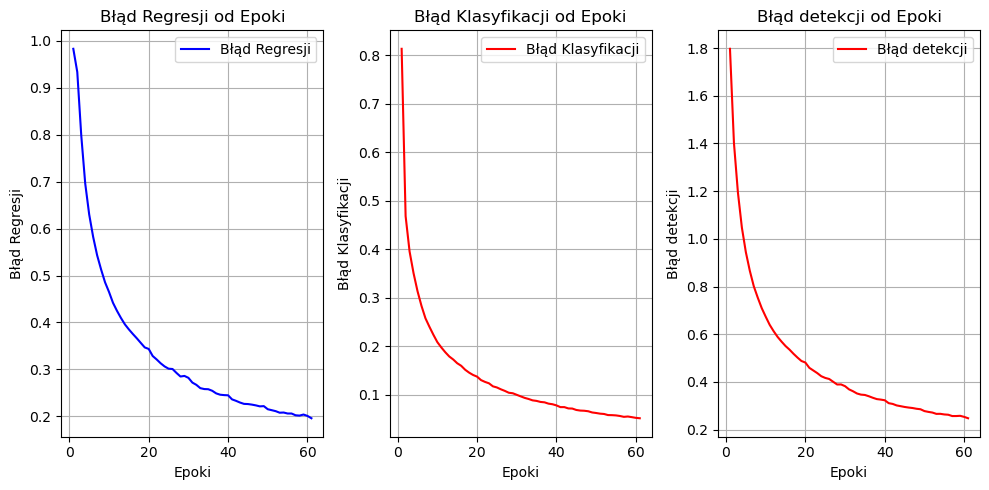

In [ ]:
import matplotlib.pyplot as plt

epochs = range(1, len(regr_hist) + 1)

plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.plot(epochs, regr_hist, 'b', label='Błąd Regresji')
plt.title('Błąd Regresji od Epoki')
plt.xlabel('Epoki')
plt.ylabel('Błąd Regresji')
plt.grid()
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(epochs, clas_hist, 'r', label='Błąd Klasyfikacji')
plt.title('Błąd Klasyfikacji od Epoki')
plt.xlabel('Epoki')
plt.ylabel('Błąd Klasyfikacji')
plt.grid()
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(epochs, loss_hist, 'r', label='Błąd detekcji')
plt.title('Błąd detekcji od Epoki')
plt.xlabel('Epoki')
plt.ylabel('Błąd detekcji')
plt.grid()
plt.legend()

plt.tight_layout()
plt.show()

## Training loss

## Evaluate loaded model

In [ ]:
model.eval()
try:
    evaluate(dataset=wider_val_dataset, model=model, threshold=0.1)
except Exception as e:
    print(f"Error: {e}")

creating index...
index created!
Loading and preparing results...
DONE (t=0.12s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=3.18s).
Accumulating evaluation results...
DONE (t=0.13s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.206
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.476
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.136
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.118
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.396
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.426
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.085
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.221
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.265
 Average Recall     (AR) @[ IoU=0.5

## Predict boxes in images using a loaded model

In [ ]:
print(len(wider_val_dataset))

920


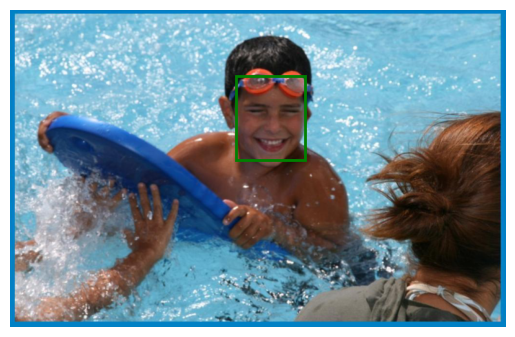

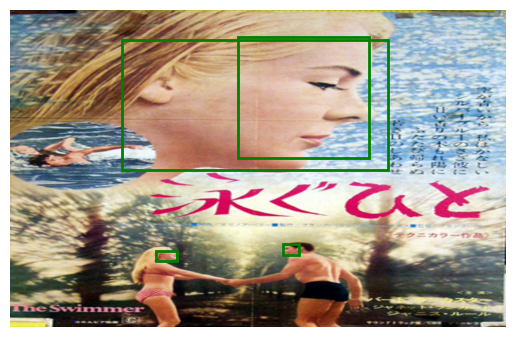

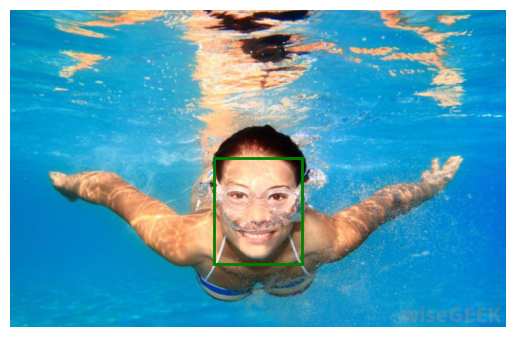

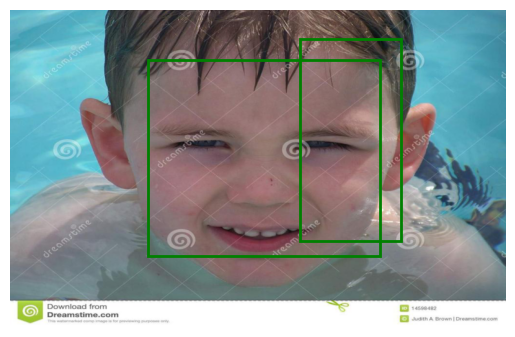

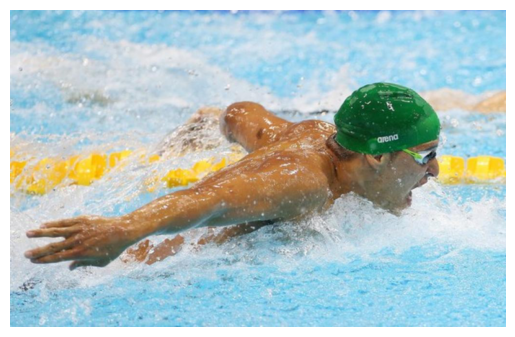

...

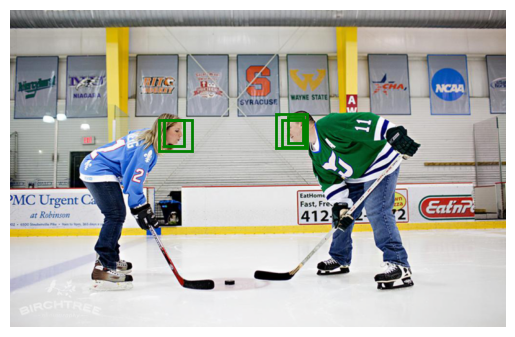

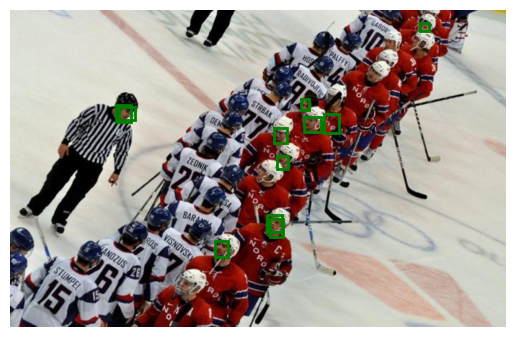

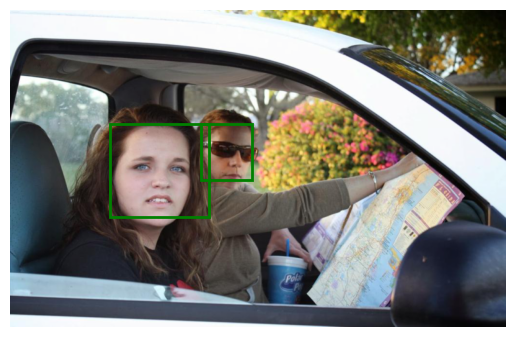

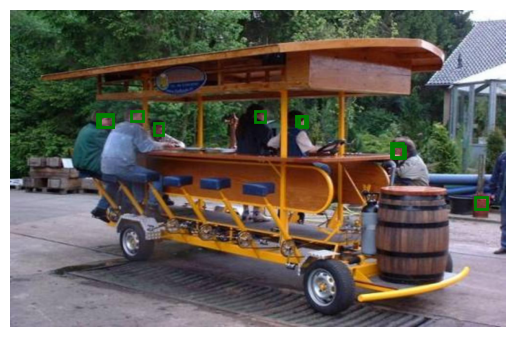

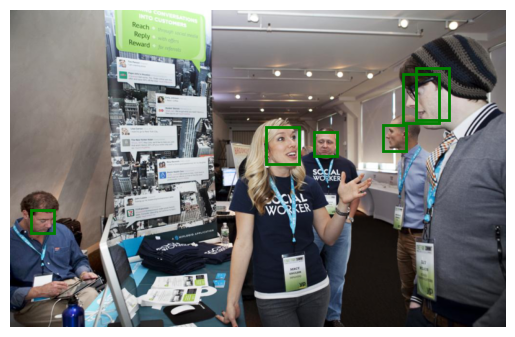

In [ ]:
model.set_eval_thresholds(nms_threshold=0.5, score_threshold=0.25)
for i in range(0, len(wider_val_dataset), 20):
    data = wider_val_dataset[i]
    model.eval()
    if torch.cuda.is_available():
        scores, labels, boxes = model([data['img'].cuda().float().unsqueeze(0), data['boxes_list'].cuda().unsqueeze(0)])
    else:
        scores, labels, boxes = model([data['img'].float().unsqueeze(0), data['boxes_list'].unsqueeze(0)])
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    inverse_normalize_transform = Normalize(
        mean=[-m / s for m, s in zip(mean, std)],
        std=[1 / s for s in std]
    )
    image = inverse_normalize_transform(data['img'])

    boxes = boxes.cpu()
    with torch.no_grad():
        show_image(image, boxes)